In [1]:
!pip install efficientnet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.6 MB/s eta 0:00:00


In [2]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Activation, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import efficientnet.tfkeras as efn

from keras.models import Sequential, Model
from PIL import Image
from skimage import transform
import os
import random
import matplotlib.pyplot as plt
import numpy as np
from keras.utils import plot_model
from sklearn.metrics import classification_report, confusion_matrix
from collections import Counter
import itertools
import cv2

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [3]:
train_folders = '/kaggle/input/chest-xray-pneumonia/chest_xray/train/'
valid_folders = '/kaggle/input/chest-xray-pneumonia/chest_xray/val/'
test_folders = '/kaggle/input/chest-xray-pneumonia/chest_xray/test/'

In [4]:
photo_size=299

In [5]:
def prepare_dataset(data_dir):
    datagen = ImageDataGenerator(
        rescale= 1./255,
        rotation_range=40,
        width_shift_range=.2,
        height_shift_range=.2,
        shear_range=.1,
        zoom_range=.2,
        horizontal_flip=True,
        fill_mode='nearest',
    )
    generator = datagen.flow_from_directory(
        data_dir,
        shuffle=True,
        color_mode = "rgb",
        target_size=(photo_size,photo_size),
        class_mode='binary',
        batch_size=128,
        classes=['NORMAL','PNEUMONIA']
    )
    return generator

In [6]:
train_generator=prepare_dataset('../input/chest-xray-pneumonia/chest_xray/train/')
validation_generator = prepare_dataset('../input/chest-xray-pneumonia/chest_xray/val/')
test_generator=prepare_dataset('../input/chest-xray-pneumonia/chest_xray/test/')

Found 5216 images belonging to 2 classes.
Found 16 images belonging to 2 classes.
Found 624 images belonging to 2 classes.


In [7]:
validation_generator.class_indices

{'NORMAL': 0, 'PNEUMONIA': 1}

In [8]:
def show_few_images(number_of_examples=6, models=None):
    figure1, ax1 = plt.subplots(number_of_examples,len(os.listdir(test_folders)), figsize=(20,4*number_of_examples))
    ax1 = ax1.reshape(-1)
    axoff_fun = np.vectorize(lambda ax:ax.axis('off'))
    axoff_fun(ax1)
    axs = 0
    for i, folder in enumerate(os.listdir(test_folders)):
        
        image_ids = os.listdir(os.path.join(test_folders,folder))
        for j in [random.randrange(0, len(image_ids)) for i in range(0,number_of_examples)]:
            path = os.path.join(test_folders,folder,image_ids[j])
            
            display = plt.imread(path)
            plt.axis('off')
            figure1.tight_layout()
            ax1[axs].imshow(display)
            title = 'True: '+folder

            if(models):
                for model in models:
                    if (model==efficientnetb7):
                        img = cv2.resize(cv2.imread(path),(299,299))
                        img_normalized = img/255
                        image_efficientnetb7_prediction = efficientnetb7.predict(np.array([img_normalized])).argmax()
                        if (image_efficientnetb7_prediction==1):
                            title = title+"\nefficientnetb7 Prediction: PNEUMONIA"
                        else:
                            title = title+"\nefficientnetb7 Prediction: NORMAL"
            ax1[axs].set_title(title)
            axs=axs+1

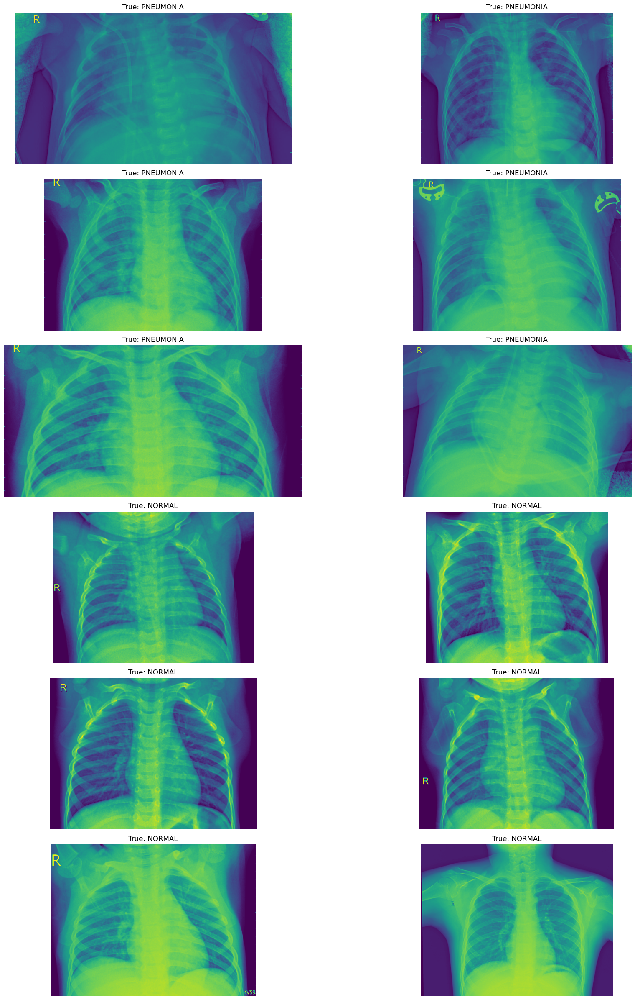

In [9]:
show_few_images()

In [10]:
epochs = 100

In [11]:
EfficientNetB7_model = efn.EfficientNetB7(weights = 'imagenet', include_top = False, input_shape = (299,299, 3))
for layer in EfficientNetB7_model.layers:
    layer.trainable = False
efficientnetb7_x = Flatten()(EfficientNetB7_model.output)
efficientnetb7_x = Dense(512, activation='relu')(efficientnetb7_x)
efficientnetb7_x = Dense(256, activation='relu')(efficientnetb7_x)
efficientnetb7_x = Dropout(0.5)(efficientnetb7_x)
efficientnetb7_x = Dense(2, activation = 'sigmoid')(efficientnetb7_x)
efficientnetb7 = Model(inputs=EfficientNetB7_model.input, outputs=efficientnetb7_x)
efficientnetb7.summary()

258434480/258434480 [==============================] - 2s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 stem_conv (Conv2D)             (None, 150, 150, 64  1728        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 stem_bn (BatchNormalization)   (None, 150, 150, 64  256         ['stem_conv[0][0]']              
                           

In [12]:
efficientnetb7.compile(loss = 'sparse_categorical_crossentropy', optimizer = Adam(learning_rate=0.001), metrics=['accuracy'])

history_efficientnetb7 = efficientnetb7.fit(
    train_generator,
    epochs = epochs,
    validation_data = validation_generator
    )
efficientnetb7.save("EfficientNetB7_100.h5")

Epoch 1/100


2023-06-26 21:00:14.493756: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


41/41 [==============================] - 260s 6s/step - loss: 10.5930 - accuracy: 0.7310 - val_loss: 0.9435 - val_accuracy: 0.8750
Epoch 2/100
41/41 [==============================] - 197s 5s/step - loss: 0.5745 - accuracy: 0.8342 - val_loss: 0.7133 - val_accuracy: 0.5625
Epoch 3/100
41/41 [==============================] - 203s 5s/step - loss: 0.3283 - accuracy: 0.8556 - val_loss: 0.5130 - val_accuracy: 0.8125
Epoch 4/100
41/41 [==============================] - 201s 5s/step - loss: 0.2871 - accuracy: 0.8834 - val_loss: 0.7919 - val_accuracy: 0.7500
Epoch 5/100
41/41 [==============================] - 201s 5s/step - loss: 0.2620 - accuracy: 0.8974 - val_loss: 0.8361 - val_accuracy: 0.8125
Epoch 6/100
41/41 [==============================] - 200s 5s/step - loss: 0.2445 - accuracy: 0.9036 - val_loss: 1.0862 - val_accuracy: 0.6250
Epoch 7/100
41/41 [==============================] - 200s 5s/step - loss: 0.2303 - accuracy: 0.9055 - val_loss: 0.9446 - val_accuracy: 0.8125
Epoch 8/100
41/41

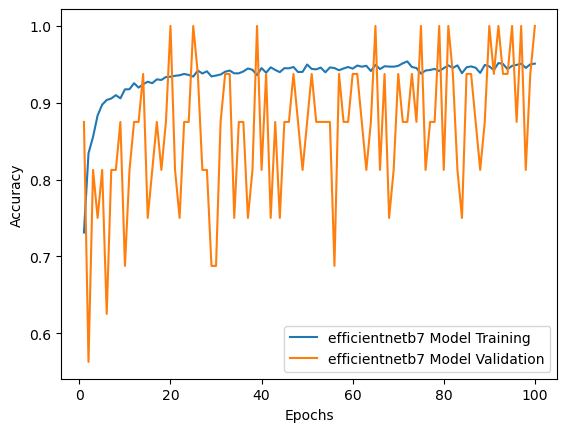

In [13]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# create data
x=[]
for i in range(1,(epochs+1)):
    x.append(i)

# plot lines
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.plot(x, history_efficientnetb7.history['accuracy'], label = "efficientnetb7 Model Training", linestyle="-")
plt.plot(x, history_efficientnetb7.history['val_accuracy'], label = "efficientnetb7 Model Validation", linestyle="-")
plt.legend()
plt.show()

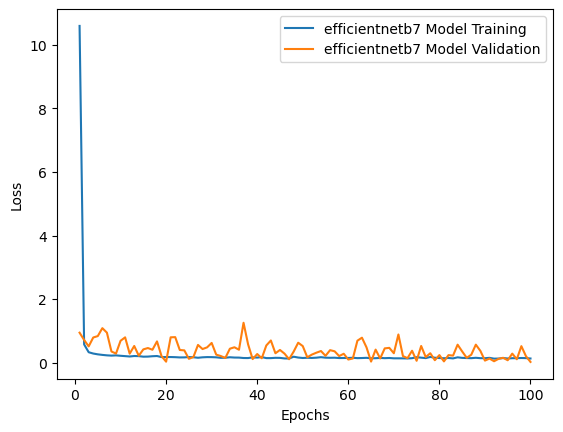

In [14]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# create data
x=[]
for i in range(1,(epochs+1)):
    x.append(i)

# plot lines
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.plot(x, history_efficientnetb7.history['loss'], label = "efficientnetb7 Model Training", linestyle="-")
plt.plot(x, history_efficientnetb7.history['val_loss'], label = "efficientnetb7 Model Validation", linestyle="-")
plt.legend()
plt.show()

In [15]:
true_value = []
pred_efficientnetb7 = []

for folder in os.listdir(test_folders):
    
    test_image_ids = os.listdir(os.path.join(test_folders,folder))
    
    for image_id in test_image_ids[:int(len(test_image_ids))]:
        
        path = os.path.join(test_folders,folder,image_id)
        
        true_value.append(test_generator.class_indices[folder])
        img = cv2.resize(cv2.imread(path),(299,299))
        img_normalized = img/255
        
        image_efficientnetb7_prediction = efficientnetb7.predict(np.array([img_normalized])).argmax()
        pred_efficientnetb7.append(image_efficientnetb7_prediction)
        
print(true_value)
print(pred_efficientnetb7)

1/1 [==============================] - 0s 56ms/step
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [16]:
from sklearn.metrics import confusion_matrix
import itertools
def clf_report(true_value, model_pred):
    classes = test_generator.class_indices.keys()
    TP_count = [true_value[i] == model_pred[i] for i in range(len(true_value))]
    model_accuracy = np.sum(TP_count)/len(TP_count)
    print('Model Accuracy', model_accuracy)

    plt.figure(figsize=(7,7))
    cm = confusion_matrix(true_value,model_pred)
    plt.imshow(cm,interpolation='nearest',cmap=plt.cm.viridis)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    thresh = cm.max()*0.8
    for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
        plt.text(j,i,cm[i,j],
                horizontalalignment="center",
                color="black" if cm[i,j] > thresh else "white")
        pass

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    pass

    print(classification_report(true_value, model_pred, target_names = list(classes)))

Model Accuracy 0.7596153846153846
              precision    recall  f1-score   support

      NORMAL       0.64      0.82      0.72       234
   PNEUMONIA       0.87      0.72      0.79       390

    accuracy                           0.76       624
   macro avg       0.76      0.77      0.75       624
weighted avg       0.78      0.76      0.76       624



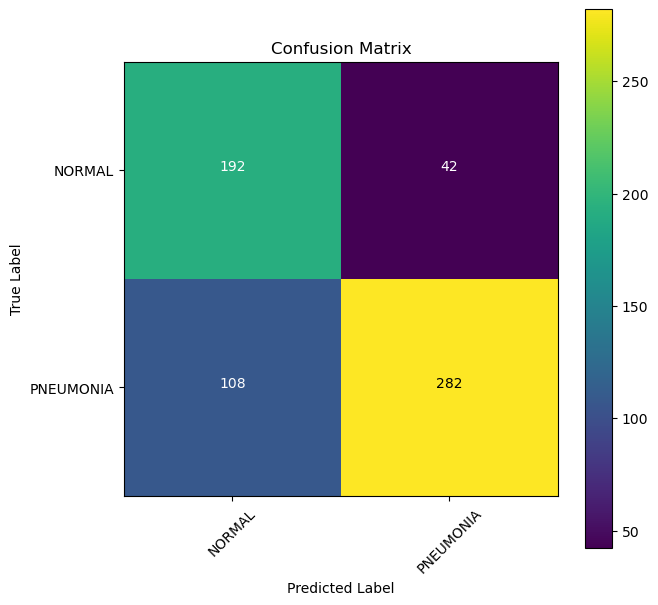

In [17]:
clf_report(true_value, pred_efficientnetb7)

In [18]:
models = [efficientnetb7]

1/1 [==============================] - 0s 43ms/step


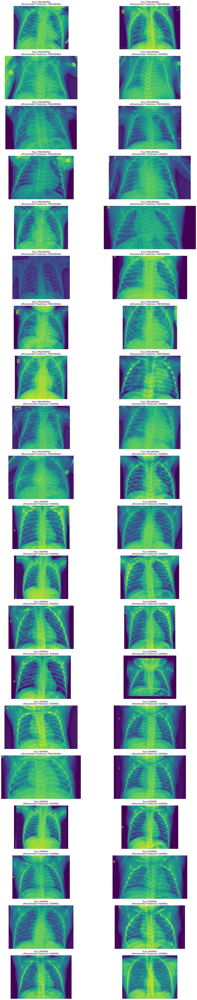

In [19]:
show_few_images(20, models)